In [ ]:
# 고속도로구간별 도로위험지수정보 API : 검색 후 다운로드 받을 수 있다. 
# 고속도로구간별 도로위험지수정보 Route
# 1. 노드링크데이타 수집가능 > 고속도로구간인지 분류 가능
# (ID 번호 앞의 세자리수 : 고속도로 확인, 예:413), https://www.its.go.kr/nodelink/
# 2. 사고데이터 : 사망자, 중상자, 경상자, 정확한 사고 위치 표에서는 확인 안되고 지도 상에는 나와 있음.
  # TAAS, 지도상에서 일일이 찍어서 위도, 경도를 찾는다. 
# 세종지역만 한정해서 위험지수를 계산하는 것은 가능하다.
# 위험도지수가 낮은 도로를 따라서 출발지에서 도착지로 가는 경로를 구하는 문제(DQN)
# Route : 도로상의 최단거리 (라이브러리, 위험도 지수가 없다.)
# 세종시의 도로 따라서 이동 : 1. 세종시 도로별 위험도지수(위치)     
# 2. 노드, 링크에 색상으로 입혀야
# 범위 1) 위험도:0,보상:10, 녹색  2) 위험도 : 0<--<=10, 보상:5, 파란색  3) 위험도: 10< -- <= 20, 보상:4 , 노란색 
# 4) 20< -- <=30, 보상:3, 보라색   5) 30<--<=40, 보상:2, 주홍색   6) 40<--<=50, 보상 : 1, 빨간색      
# 3. DQN을 써서 위험도가 가장 낮은 경로 선택 (보상기준 : 위험도 지수의 역수, deep-q-learning 파일 참조) 

In [ ]:
# 표준노드링크(지능형교통체계관리시스템, nodelink.its.go.kr) > 표준노드/링크자료실 > 전국표준노드링크 
#  > NODELINKDATA.zip 
# https://www.its.go.kr/nodelink/intro (노드와 링크 정의 및 개념 상세 설명)

In [1]:
# shapefile > 지리현상에 대한 기하학적 위치와 속성 정보를 저장, 제공해 주는 데이터 포맷
# shp, shx, dbf > 이 3개의 확장 포맷을 통틀어 shapefile 이라고 부름
# shp, shx > 공간데이터
# dbf > 속성정보  
!pip install pyshp

Defaulting to user installation because normal site-packages is not writeable


In [2]:
!pip install pyproj 

Defaulting to user installation because normal site-packages is not writeable


In [3]:
import shapefile
from pyproj import Proj, transform
import networkx as nx
import numpy as np
import pandas as pd
import json
import requests
import branca

In [4]:
shp_path_node = "MOCT_NODE.shp"
# 노드링크 zip 파일을 다운로드 후 압축해제

In [5]:
sf_node = shapefile.Reader(shp_path_node, encoding='cp949')   # sf_node : node의 정보

In [6]:
print(sf_node)

shapefile Reader
    203020 shapes (type 'POINT')
    203020 records (9 fields)


In [7]:
shp_path_link = "MOCT_LINK.shp"

In [8]:
sf_link = shapefile.Reader(shp_path_link, encoding='cp949')   # sf_link : link의 정보

In [9]:
print(sf_link)

shapefile Reader
    544457 shapes (type 'POLYLINE')
    544457 records (22 fields)


In [10]:
fields_node = [x[0] for x in sf_node.fields][1:]  # fields_node : sf_node의 fields 정보
# [x[0] for x in sf_node.fields] : DetectionFlag, NODE_ID, ...., HISTREMARK

In [11]:
print(sf_node.fields)  

[('DeletionFlag', 'C', 1, 0), ['NODE_ID', 'C', 10, 0], ['NODE_TYPE', 'C', 3, 0], ['NODE_NAME', 'C', 30, 0], ['TURN_P', 'C', 1, 0], ['UPDATEDATE', 'C', 8, 0], ['REMARK', 'C', 30, 0], ['HIST_TYPE', 'C', 8, 0], ['HISTREMARK', 'C', 30, 0]]


In [12]:
print(fields_node)

['NODE_ID', 'NODE_TYPE', 'NODE_NAME', 'TURN_P', 'UPDATEDATE', 'REMARK', 'HIST_TYPE', 'HISTREMARK']


In [13]:
records_node = sf_node.records()     # records_node : sf_node의 값들

In [14]:
print(records_node)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [15]:
shps = [s.points for s in sf_node.shapes()]  # shps : 한국에서 쓰는 위도(latitude),경도(longitude)
# node : 좌표값을 갖고 있다. 

In [16]:
shps

[[[201083.09360000025, 558707.9103999995]],
 [[201112.40670000017, 558709.3311999999]],
 [[201205.5401999997, 558730.6302000005]],
 [[201590.65450000018, 558736.2149999999]],
 [[201129.53299999982, 558785.9604000002]],
 [[203428.60840000026, 558743.9639999997]],
 [[201118.18010000046, 558789.8479999993]],
 [[203551.77219999954, 558759.9289999995]],
 [[201354.3685999997, 558759.0730000008]],
 [[203830.06149999984, 558763.1040000003]],
 [[201588.2731999997, 558781.1413000003]],
 [[203454.46889999975, 558771.6765000001]],
 [[202653.00069999974, 558779.4712000005]],
 [[203497.34729999956, 558783.4927999992]],
 [[201329.6299999999, 558786.4573999997]],
 [[203891.6579, 558791.3862999994]],
 [[202215.65720000025, 558819.3001000006]],
 [[203520.87939999998, 558837.7906999998]],
 [[203416.4534, 558926.5683999993]],
 [[195212.8289999999, 592101.0045999996]],
 [[201528.06790000014, 558936.4763999991]],
 [[203668.50299999956, 559005.4042000007]],
 [[202086.71690000035, 559015.1922999993]],
 [[2015

In [17]:
fields_link = [x[0] for x in sf_link.fields][1:]

In [18]:
print(sf_link.fields)

[('DeletionFlag', 'C', 1, 0), ['LINK_ID', 'C', 10, 0], ['F_NODE', 'C', 10, 0], ['T_NODE', 'C', 10, 0], ['LANES', 'N', 4, 0], ['ROAD_RANK', 'C', 3, 0], ['ROAD_TYPE', 'C', 3, 0], ['ROAD_NO', 'C', 5, 0], ['ROAD_NAME', 'C', 30, 0], ['ROAD_USE', 'C', 1, 0], ['MULTI_LINK', 'C', 1, 0], ['CONNECT', 'C', 3, 0], ['MAX_SPD', 'N', 4, 0], ['REST_VEH', 'C', 3, 0], ['REST_W', 'N', 4, 0], ['REST_H', 'N', 4, 0], ['C-ITS', 'C', 1, 0], ['LENGTH', 'N', 18, 12], ['UPDATEDATE', 'C', 8, 0], ['REMARK', 'C', 30, 0], ['HIST_TYPE', 'C', 8, 0], ['HISTREMARK', 'C', 30, 0]]


In [19]:
print(fields_link)   # fields_link : sf_link의 fields 정보

['LINK_ID', 'F_NODE', 'T_NODE', 'LANES', 'ROAD_RANK', 'ROAD_TYPE', 'ROAD_NO', 'ROAD_NAME', 'ROAD_USE', 'MULTI_LINK', 'CONNECT', 'MAX_SPD', 'REST_VEH', 'REST_W', 'REST_H', 'C-ITS', 'LENGTH', 'UPDATEDATE', 'REMARK', 'HIST_TYPE', 'HISTREMARK']


In [20]:
records_link = sf_link.records()    # records_link : sf_link의 값들

In [21]:
node_dataframe = pd.DataFrame(columns=fields_node, data=records_node)

In [22]:
node_dataframe.head()

,NODE_ID,NODE_TYPE,NODE_NAME,TURN_P,UPDATEDATE,REMARK,HIST_TYPE,HISTREMARK
0,1080010300,101,인수봉길-쌈지마당길진,0,20230519,,,
1,1080010400,101,쌈지마당길-인수봉길진,0,20230519,,,
2,1080010500,101,신망애피아노,0,20230519,,,
3,1080010600,101,네네치킨,1,20230519,,,
4,1080010700,101,쌈지마당길-인수봉길진,0,20230519,,,


In [23]:
node_dataframe

,NODE_ID,NODE_TYPE,NODE_NAME,TURN_P,UPDATEDATE,REMARK,HIST_TYPE,HISTREMARK
0,1080010300,101,인수봉길-쌈지마당길진,0,20230519,,,
1,1080010400,101,쌈지마당길-인수봉길진,0,20230519,,,
2,1080010500,101,신망애피아노,0,20230519,,,
3,1080010600,101,네네치킨,1,20230519,,,
4,1080010700,101,쌈지마당길-인수봉길진,0,20230519,,,
...,...,...,...,...,...,...,...,...
203015,1610142000,103,운북동752-37,0,20230717,,NODE0001,
203016,1610142400,103,운북동583-12,0,20230717,,NODE0001,
203017,1610142500,103,운북동583-12,0,20230717,,NODE0001,
203018,1610142200,103,운북동581-55,0,20230717,,NODE0001,


In [24]:
node_dataframe = node_dataframe.assign(coords=shps)

In [25]:
node_dataframe

,NODE_ID,NODE_TYPE,NODE_NAME,TURN_P,UPDATEDATE,REMARK,HIST_TYPE,HISTREMARK,coords
0,1080010300,101,인수봉길-쌈지마당길진,0,20230519,,,,"[[201083.09360000025, 558707.9103999995]]"
1,1080010400,101,쌈지마당길-인수봉길진,0,20230519,,,,"[[201112.40670000017, 558709.3311999999]]"
2,1080010500,101,신망애피아노,0,20230519,,,,"[[201205.5401999997, 558730.6302000005]]"
3,1080010600,101,네네치킨,1,20230519,,,,"[[201590.65450000018, 558736.2149999999]]"
4,1080010700,101,쌈지마당길-인수봉길진,0,20230519,,,,"[[201129.53299999982, 558785.9604000002]]"
...,...,...,...,...,...,...,...,...,...
203015,1610142000,103,운북동752-37,0,20230717,,NODE0001,,"[[156470.14476067462, 546316.0856704381]]"
203016,1610142400,103,운북동583-12,0,20230717,,NODE0001,,"[[157736.30655563273, 545137.8274029625]]"
203017,1610142500,103,운북동583-12,0,20230717,,NODE0001,,"[[157742.85931102568, 545147.2469888408]]"
203018,1610142200,103,운북동581-55,0,20230717,,NODE0001,,"[[157488.73495340132, 545334.6166734663]]"


In [26]:
link_dataframe = pd.DataFrame(columns=fields_link, data=records_link)

In [27]:
link_dataframe

,LINK_ID,F_NODE,T_NODE,LANES,ROAD_RANK,ROAD_TYPE,ROAD_NO,ROAD_NAME,ROAD_USE,MULTI_LINK,...,MAX_SPD,REST_VEH,REST_W,REST_H,C-ITS,LENGTH,UPDATEDATE,REMARK,HIST_TYPE,HISTREMARK
0,3620033001,3620016502,3620012200,1,106,000,927,봉호로,0,0,...,50,0,0,0,0,10388.784111,20230519,,,
1,3620038802,3620008701,3620019000,2,107,000,-,홍술로,0,0,...,60,0,0,0,0,189.852452,20230519,,,
2,3620149100,3620063200,3620067900,2,107,000,-,삼분2길,0,0,...,50,0,0,0,0,156.785095,20230519,,,
3,3670134000,3670061100,3670061200,2,103,003,26,동고령로,0,0,...,80,0,0,0,0,293.967615,20230519,,,
4,3670016500,3670007400,3670007800,1,106,000,905,성암로,0,0,...,60,0,0,0,0,1939.169843,20230519,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
544452,3670359005,3670007203,3670007204,2,107,000,-,다산산단로,0,0,...,50,0,0,0,0,245.953621,20230519,,,
544453,3620032002,3620013801,3620015000,1,105,000,79,일직점곡로,0,0,...,50,0,0,0,0,4122.305092,20230519,,,
544454,3620032901,3620012200,3620016502,1,106,000,927,봉호로,0,0,...,50,0,0,0,0,10382.029023,20230519,,,
544455,3620032902,3620016502,3620016500,1,106,000,927,봉호로,0,0,...,50,0,0,0,0,4474.959995,20230519,,,


In [28]:
node_dataframe["NODE_ID"]

0         1080010300
1         1080010400
2         1080010500
3         1080010600
4         1080010700
             ...    
203015    1610142000
203016    1610142400
203017    1610142500
203018    1610142200
203019    3000209500
Name: NODE_ID, Length: 203020, dtype: object

In [29]:
node_dataframe["NODE_ID"][0:1]

0    1080010300
Name: NODE_ID, dtype: object

In [30]:
z=node_dataframe["NODE_ID"].tolist()
z

['1080010300',
 '1080010400',
 '1080010500',
 '1080010600',
 '1080010700',
 '1080010800',
 '1080010900',
 '1080011000',
 '1080011100',
 '1080011200',
 '1080011300',
 '1080011400',
 '1080011500',
 '1080011600',
 '1080011700',
 '1080011800',
 '1080011900',
 '1080012000',
 '1080012100',
 '2290017321',
 '1080012200',
 '1080012400',
 '1080012500',
 '1080012600',
 '1080012700',
 '1080012800',
 '1080012900',
 '1080013000',
 '1080013300',
 '1080013400',
 '1080013500',
 '1080013600',
 '1080013700',
 '1080013800',
 '1080013900',
 '1080014000',
 '1080014100',
 '1080014200',
 '1080014300',
 '1080014400',
 '1080014700',
 '1080015000',
 '1080015100',
 '1080015200',
 '1080015300',
 '1080015400',
 '1080015500',
 '1080015600',
 '1080015700',
 '1080015800',
 '1080015900',
 '1080016000',
 '1080016100',
 '1080016200',
 '1080016300',
 '1080016400',
 '1080016500',
 '1080016600',
 '1080016700',
 '1080016800',
 '1080016900',
 '1080017100',
 '1080017200',
 '1080017400',
 '1080017500',
 '1080017600',
 '10800177

In [31]:
z[0]

'1080010300'

In [32]:
z[0][:3]

'108'

In [33]:
sejong_node_idx = [int(node[:3])>=413 and int(node[:3])<=413 for node in node_dataframe["NODE_ID"].tolist()]

In [34]:
sejong_node_idx

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,


In [35]:
df_node = node_dataframe[sejong_node_idx]

In [36]:
df_node

,NODE_ID,NODE_TYPE,NODE_NAME,TURN_P,UPDATEDATE,REMARK,HIST_TYPE,HISTREMARK,coords
85621,4130177301,101,해밀동산41,1,20230519,,,,"[[223533.5619000001, 436323.2960999999]]"
85689,4130178201,101,해밀동산12,0,20230519,,,,"[[223982.2377000004, 436722.5413000006]]"
94464,4130063500,101,두루유치원,0,20230519,,,,"[[221432.0719999997, 435793.5460999999]]"
94465,4130063600,101,고운동2058,0,20230519,,,,"[[221433.4813000001, 435220.47699999996]]"
94466,4130063700,101,두루중학교앞교차로,0,20230519,,,,"[[221433.8864000002, 435482.04209999926]]"
...,...,...,...,...,...,...,...,...,...
168118,4130173100,101,동일기업,0,20230519,,,,"[[235365.06060000043, 436861.24090000056]]"
168119,4130173200,101,S-Oil차사랑,0,20230519,,,,"[[235511.60699999984, 436897.1118000001]]"
168120,4130173300,102,S-Oil차사랑,0,20230519,,,,"[[235546.00549999997, 436991.8987000007]]"
168121,4130173400,102,문곡리1100-3,0,20230519,,,,"[[235771.97059999965, 436234.67789999954]]"


In [37]:
sejong_link_idx = [int(link[:3])>=413 and int(link[:3])<=413 for link in link_dataframe["LINK_ID"].tolist()]

In [38]:
df_link = link_dataframe[sejong_link_idx]

In [39]:
df_link

,LINK_ID,F_NODE,T_NODE,LANES,ROAD_RANK,ROAD_TYPE,ROAD_NO,ROAD_NAME,ROAD_USE,MULTI_LINK,...,MAX_SPD,REST_VEH,REST_W,REST_H,C-ITS,LENGTH,UPDATEDATE,REMARK,HIST_TYPE,HISTREMARK
21638,4130415500,4130131200,4130132600,2,103,000,1,세종로,0,0,...,50,0,0,0,0,422.412013,20230519,,,
21650,4130106700,4130124100,4130125200,1,104,000,-,안금로,0,0,...,30,0,0,0,0,55.976404,20230519,,,
21661,4130413200,4130132600,4130132100,2,103,000,1,세종로,0,0,...,50,0,0,0,0,418.117004,20230519,,,
24182,4130391900,4130126700,4130125300,1,104,000,-,문예회관길,0,0,...,40,0,0,0,0,108.427780,20230519,,,
24211,4130276000,4130076400,4130075200,2,104,000,-,달빛로,0,0,...,30,0,0,0,0,345.938950,20230519,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
435234,4130326500,4130149300,4130146800,2,104,002,-,한누리대로,0,0,...,50,0,0,0,0,406.207262,20230519,,,
435236,4130355900,4130122200,4130120100,1,104,000,-,봉암길,0,0,...,30,0,0,0,0,182.666402,20230519,,,
435238,4130356000,4130120100,4130122200,1,104,000,-,봉암길,0,0,...,30,0,0,0,0,193.174023,20230519,,,
435239,4130356300,4130122200,4130120100,1,104,002,-,봉암길,0,0,...,30,0,0,0,0,187.224048,20230519,,,


In [40]:
# 한국 위도, 경도를 구글에서 사용하는 위도, 경도로 변환해주는 작업
# df_node의 컬럼 중 coords가 사라지고, latitude, longitude 생성

In [41]:
inProj = Proj(init = 'epsg:5186')

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [42]:
outProj = Proj(init = 'epsg:4326')

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [43]:
latitude = []
longitude = []
for idx, row in df_node.iterrows(): # iterrows():DataFrame을 행 단위로 반복(iterate)하면서 각 행의 인덱스와 데이터를 반환, pandas method
    x,y = row.coords[0][0], row.coords[0][1]
    nx, ny = transform(inProj, outProj, x, y)
    latitude.append(ny)
    longitude.append(nx)
df_node['latitude']=latitude
df_node['longitude']=longitude
del df_node['coords']

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5360\3411135216.py:5: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  nx, ny = transform(inProj, outProj, x, y)
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5360\3411135216.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_node['latitude']=latitude
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5360\3411135216.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

In [44]:
df_node.rename(columns={'NODE_ID':'id'}, inplace=True)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5360\3973333237.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_node.rename(columns={'NODE_ID':'id'}, inplace=True)


In [45]:
df_link.rename(columns={'F_NODE':'Source', 'T_NODE':'Target'}, inplace=True)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5360\3662625770.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_link.rename(columns={'F_NODE':'Source', 'T_NODE':'Target'}, inplace=True)


In [46]:
df_node.head()

,id,NODE_TYPE,NODE_NAME,TURN_P,UPDATEDATE,REMARK,HIST_TYPE,HISTREMARK,latitude,longitude
85621,4130177301,101,해밀동산41,1,20230519,,,,36.524914,127.262761
85689,4130178201,101,해밀동산12,0,20230519,,,,36.528501,127.267783
94464,4130063500,101,두루유치원,0,20230519,,,,36.520190,127.239283
94465,4130063600,101,고운동2058,0,20230519,,,,36.515026,127.239283
94466,4130063700,101,두루중학교앞교차로,0,20230519,,,,36.517383,127.239295


In [47]:
df_link.head()

,LINK_ID,Source,Target,LANES,ROAD_RANK,ROAD_TYPE,ROAD_NO,ROAD_NAME,ROAD_USE,MULTI_LINK,...,MAX_SPD,REST_VEH,REST_W,REST_H,C-ITS,LENGTH,UPDATEDATE,REMARK,HIST_TYPE,HISTREMARK
21638,4130415500,4130131200,4130132600,2,103,000,1,세종로,0,0,...,50,0,0,0,0,422.412013,20230519,,,
21650,4130106700,4130124100,4130125200,1,104,000,-,안금로,0,0,...,30,0,0,0,0,55.976404,20230519,,,
21661,4130413200,4130132600,4130132100,2,103,000,1,세종로,0,0,...,50,0,0,0,0,418.117004,20230519,,,
24182,4130391900,4130126700,4130125300,1,104,000,-,문예회관길,0,0,...,40,0,0,0,0,108.427780,20230519,,,
24211,4130276000,4130076400,4130075200,2,104,000,-,달빛로,0,0,...,30,0,0,0,0,345.938950,20230519,,,


In [48]:
nodes = df_node[["id", 'latitude', 'longitude']]
links = df_link[['LINK_ID', 'Source', 'Target', 'ROAD_NAME', 'MAX_SPD', 'LENGTH']]

In [49]:
nodes.head()

,id,latitude,longitude
85621,4130177301,36.524914,127.262761
85689,4130178201,36.528501,127.267783
94464,4130063500,36.520190,127.239283
94465,4130063600,36.515026,127.239283
94466,4130063700,36.517383,127.239295


In [50]:
links.head()

,LINK_ID,Source,Target,ROAD_NAME,MAX_SPD,LENGTH
21638,4130415500,4130131200,4130132600,세종로,50,422.412013
21650,4130106700,4130124100,4130125200,안금로,30,55.976404
21661,4130413200,4130132600,4130132100,세종로,50,418.117004
24182,4130391900,4130126700,4130125300,문예회관길,40,108.427780
24211,4130276000,4130076400,4130075200,달빛로,30,345.938950


In [51]:
source_in = [ node in nodes['id'].tolist() for node in links['Source']]
target_in = [ node in nodes['id'].tolist() for node in links['Target']]
sejong_links = links[[x & y for x,y in zip(source_in, target_in)]]


In [52]:
source_in

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,

In [53]:
source_in = [ node in nodes['id'].tolist() for node in links['Source']]
target_in = [ node in nodes['id'].tolist() for node in links['Target']]
a=[x & y for x,y in zip(source_in, target_in)]
a

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True

In [54]:
print(len(links))

4829


In [55]:
print(len(sejong_links))

4785


In [56]:
sejong_links.head()

,LINK_ID,Source,Target,ROAD_NAME,MAX_SPD,LENGTH
21638,4130415500,4130131200,4130132600,세종로,50,422.412013
21650,4130106700,4130124100,4130125200,안금로,30,55.976404
21661,4130413200,4130132600,4130132100,세종로,50,418.117004
24182,4130391900,4130126700,4130125300,문예회관길,40,108.427780
24211,4130276000,4130076400,4130075200,달빛로,30,345.938950


In [57]:
source_latitude = []
source_longitude = []
target_latitude = []
target_longitude = []
source_nodes = sejong_links['Source'].tolist()
target_nodes = sejong_links['Target'].tolist()
nodes_list = nodes["id"].tolist()
for s_node, t_node in zip(source_nodes, target_nodes):
    s_lat, s_log = nodes.iloc[nodes_list.index(s_node), 1:3]  
    # nodes_list.index(s_node) : nodes_list내의 s_node의 index값  
    t_lat, t_log = nodes.iloc[nodes_list.index(t_node), 1:3]
    source_latitude.append(s_lat)
    source_longitude.append(s_log)
    target_latitude.append(t_lat)
    target_longitude.append(t_log)

In [58]:
sejong_links['S_latitude']=source_latitude
sejong_links['S_longitude']=source_longitude
sejong_links['t_latitude']=target_latitude
sejong_links['t_longitude']=target_longitude

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5360\420845048.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sejong_links['S_latitude']=source_latitude
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5360\420845048.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sejong_links['S_longitude']=source_longitude
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5360\420845048.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

In [59]:
df=sejong_links
df.reset_index(drop=True, inplace=True)
df

,LINK_ID,Source,Target,ROAD_NAME,MAX_SPD,LENGTH,S_latitude,S_longitude,t_latitude,t_longitude
0,4130415500,4130131200,4130132600,세종로,50,422.412013,36.616840,127.292084,36.613129,127.293036
1,4130106700,4130124100,4130125200,안금로,30,55.976404,36.444230,127.286373,36.444222,127.287010
2,4130413200,4130132600,4130132100,세종로,50,418.117004,36.613129,127.293036,36.616854,127.292550
3,4130391900,4130126700,4130125300,문예회관길,40,108.427780,36.598393,127.288480,36.599036,127.287642
4,4130276000,4130076400,4130075200,달빛로,30,345.938950,36.516293,127.251400,36.513297,127.250372
...,...,...,...,...,...,...,...,...,...,...
4780,4130326500,4130149300,4130146800,한누리대로,50,406.207262,36.537280,127.306734,36.536502,127.302368
4781,4130355900,4130122200,4130120100,봉암길,30,182.666402,36.561055,127.285701,36.562118,127.284063
4782,4130356000,4130120100,4130122200,봉암길,30,193.174023,36.562118,127.284063,36.561055,127.285701
4783,4130356300,4130122200,4130120100,봉암길,30,187.224048,36.561055,127.285701,36.562118,127.284063


In [60]:
type(df)

pandas.core.frame.DataFrame

In [61]:
df['S_latitude']

0       36.616840
1       36.444230
2       36.613129
3       36.598393
4       36.516293
          ...    
4780    36.537280
4781    36.561055
4782    36.562118
4783    36.561055
4784    36.562118
Name: S_latitude, Length: 4785, dtype: float64

In [62]:
import folium

In [63]:
m = folium.Map(location=[36.4989, 127.2684], zoom_start=15)
m

In [64]:
# 위험지수와 속도 데이타를 전부 고려해서 새로운 점수를 부여하는 것을 생각
# 11:30 수업, 코딩

In [65]:
df = sejong_links
for _, row in df.iterrows(): 
    source_location = [row['S_latitude'], row['S_longitude']]
    target_location = [row['t_latitude'], row['t_longitude']]
    polyline=folium.PolyLine(locations=(source_location, target_location), color='green') # 링크에만 선이 그어짐.
    m.add_child(polyline)
m

In [66]:
dfrg = pd.read_csv('C://workspace//road_geocode.csv',encoding='cp949')
dfrg

,도로명,Latitude,Longitude,사망자수,중상자수,경상자수,부상자수,사상자환산계수,사상자수,도로위험도,도로위험지수
0,가락마을6단지 602동 맞은편,36.502925,127.238998,0,5,11,0,0.6588,16,2.7452,27.452
1,내평지하차도 사거리,35.883578,128.870502,0,3,12,0,0.4320,15,2.3800,23.800
2,다빛초등학교 삼거리 (종촌동 585-6 ),36.503439,127.247331,0,7,27,0,1.0012,34,1.9876,19.876
3,대평동 264-30번지 사거리,35.439730,126.817438,0,5,11,1,0.6621,17,0.8265,8.265
4,번암사거리(번암리 161-1),36.582684,127.292946,0,2,11,0,0.3084,13,0.5000,5.000
5,상리사거리(조천교 서단),36.603401,127.305601,0,1,13,0,0.2052,14,0.2868,2.868
6,새뜸마을 1011동 앞 로타리,36.490621,127.250007,0,3,7,1,0.4013,11,0.4829,4.829
7,성남중 앞 사거리,37.504482,126.927412,0,4,6,0,0.5080,10,0.5352,5.352
8,성남중학교 네거리(어진동 222-33),36.497938,127.254977,0,5,10,3,0.6619,18,0.6786,6.786
9,세종세경아파트 앞 사거리,36.505182,127.245150,1,5,8,0,1.6384,14,1.7756,17.756


In [67]:
# 1. 사고지점의 위도, 경도와 가장 가까이에 있는 링크의 시작점 또는 도착점의 위도, 경도를 찾는다.(노드의 위도, 경도)

# 2. 코딩을 색을 입히는 것까지 완료하기

In [68]:
sj_vel = pd.read_csv('C:/workspace/sejong_855.csv', encoding='cp949')
sj_vel

,생성일,시간,LINK_ID,도로관리기관,통행속도,통행시간
0,20230810,855,4130000100,NaN,15.0,0
1,20230810,855,4130000200,NaN,21.0,0
2,20230810,855,4130000299,NaN,16.0,0
3,20230810,855,4130000300,NaN,18.0,0
4,20230810,855,4130000399,NaN,42.0,0
...,...,...,...,...,...,...
5058,20230810,855,4130649599,NaN,30.0,0
5059,20230810,855,4130649699,NaN,34.0,0
5060,20230810,855,4130649899,NaN,16.0,0
5061,20230810,855,4130649999,NaN,71.0,0


In [69]:
sj_vel['LINK_ID']

0       4130000100
1       4130000200
2       4130000299
3       4130000300
4       4130000399
           ...    
5058    4130649599
5059    4130649699
5060    4130649899
5061    4130649999
5062    4130650099
Name: LINK_ID, Length: 5063, dtype: int64

In [70]:
sj_vel['통행속도']

0       15.0
1       21.0
2       16.0
3       18.0
4       42.0
        ... 
5058    30.0
5059    34.0
5060    16.0
5061    71.0
5062    49.0
Name: 통행속도, Length: 5063, dtype: float64

In [71]:
df_sv = sj_vel[["LINK_ID", '통행속도']]
df_sv

,LINK_ID,통행속도
0,4130000100,15.0
1,4130000200,21.0
2,4130000299,16.0
3,4130000300,18.0
4,4130000399,42.0
...,...,...
5058,4130649599,30.0
5059,4130649699,34.0
5060,4130649899,16.0
5061,4130649999,71.0


In [72]:
sejong_links.head()

,LINK_ID,Source,Target,ROAD_NAME,MAX_SPD,LENGTH,S_latitude,S_longitude,t_latitude,t_longitude
0,4130415500,4130131200,4130132600,세종로,50,422.412013,36.616840,127.292084,36.613129,127.293036
1,4130106700,4130124100,4130125200,안금로,30,55.976404,36.444230,127.286373,36.444222,127.287010
2,4130413200,4130132600,4130132100,세종로,50,418.117004,36.613129,127.293036,36.616854,127.292550
3,4130391900,4130126700,4130125300,문예회관길,40,108.427780,36.598393,127.288480,36.599036,127.287642
4,4130276000,4130076400,4130075200,달빛로,30,345.938950,36.516293,127.251400,36.513297,127.250372


In [73]:
df_sv1 = df_sv['LINK_ID'].astype(str)

In [74]:
df_sv1


0       4130000100
1       4130000200
2       4130000299
3       4130000300
4       4130000399
           ...    
5058    4130649599
5059    4130649699
5060    4130649899
5061    4130649999
5062    4130650099
Name: LINK_ID, Length: 5063, dtype: object

In [75]:
df_sv2 = df_sv['통행속도'].astype(float)

In [76]:
df_sv2

0       15.0
1       21.0
2       16.0
3       18.0
4       42.0
        ... 
5058    30.0
5059    34.0
5060    16.0
5061    71.0
5062    49.0
Name: 통행속도, Length: 5063, dtype: float64

In [77]:
sj_speed=pd.concat([df_sv1, df_sv2], axis=1)

In [78]:
sj_speed

,LINK_ID,통행속도
0,4130000100,15.0
1,4130000200,21.0
2,4130000299,16.0
3,4130000300,18.0
4,4130000399,42.0
...,...,...
5058,4130649599,30.0
5059,4130649699,34.0
5060,4130649899,16.0
5061,4130649999,71.0


In [79]:
sj_speed['LINK_ID']

0       4130000100
1       4130000200
2       4130000299
3       4130000300
4       4130000399
           ...    
5058    4130649599
5059    4130649699
5060    4130649899
5061    4130649999
5062    4130650099
Name: LINK_ID, Length: 5063, dtype: object

In [80]:
sjs=pd.merge(sj_speed, sejong_links)
sjs

,LINK_ID,통행속도,Source,Target,ROAD_NAME,MAX_SPD,LENGTH,S_latitude,S_longitude,t_latitude,t_longitude
0,4130000100,15.0,4130157000,4130026400,집현북로,50,73.539693,36.501141,127.328587,36.500881,127.329341
1,4130000200,21.0,4130026400,4130157000,집현북로,50,73.539693,36.500881,127.329341,36.501141,127.328587
2,4130000300,18.0,4130050200,4130000100,풍경채길,40,275.031731,36.438242,127.218718,36.440044,127.216789
3,4130000400,29.0,4130000100,4130050200,풍경채길,40,267.525687,36.440044,127.216789,36.438242,127.218718
4,4130000500,27.0,4130030400,4130000300,학교말길,30,300.016294,36.724102,127.158038,36.721689,127.158489
...,...,...,...,...,...,...,...,...,...,...,...
4747,4130486801,23.0,4130179401,4130046300,왕의물로,40,393.144627,36.704720,127.212323,36.701544,127.210235
4748,4130486901,28.0,4130179401,4130002900,-,60,89.566313,36.704720,127.212323,36.704381,127.213224
4749,4130487001,20.0,4130002900,4130179401,-,60,89.499522,36.704381,127.213224,36.704720,127.212323
4750,4130487101,54.0,4130046400,4130179401,왕의물로,40,574.968925,36.709335,127.210599,36.704720,127.212323


In [81]:
m = folium.Map(location=[36.4989, 127.2684], zoom_start=15)
df = sjs
for _, row in df.iterrows(): 
    source_location = [row['S_latitude'], row['S_longitude']]
    target_location = [row['t_latitude'], row['t_longitude']]
    speed=row['통행속도']
    if speed <= 20:
        polyline=folium.PolyLine(locations=(source_location, target_location), color='red')
    elif speed<=40:
        polyline=folium.PolyLine(locations=(source_location, target_location), color='yellow')  # 링크에만 선이 그어짐.
    elif speed<=60:
        polyline=folium.PolyLine(locations=(source_location, target_location), color='blue')
    else:
        polyline=folium.PolyLine(locations=(source_location, target_location), color='green')
    m.add_child(polyline)
m

In [82]:
from folium import plugins
icon_numberA = plugins.BeautifyIcon(number='A', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberB = plugins.BeautifyIcon(number='B', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberC = plugins.BeautifyIcon(number='C', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberD = plugins.BeautifyIcon(number='D', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberE = plugins.BeautifyIcon(number='E', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberF = plugins.BeautifyIcon(number='F', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberG = plugins.BeautifyIcon(number='G', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberH = plugins.BeautifyIcon(number='H', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberI = plugins.BeautifyIcon(number='I', border_color='darkred', text_color='darkred', 
                                    inner_icon_style='margin-top:0;')
icon_numberJ = plugins.BeautifyIcon(number='J', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberK = plugins.BeautifyIcon(number='K', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberL = plugins.BeautifyIcon(number='L', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberM = plugins.BeautifyIcon(number='M', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberN = plugins.BeautifyIcon(number='N', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberO = plugins.BeautifyIcon(number='O', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberP = plugins.BeautifyIcon(number='P', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberQ = plugins.BeautifyIcon(number='Q', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberR = plugins.BeautifyIcon(number='R', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberS = plugins.BeautifyIcon(number='S', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
icon_numberT = plugins.BeautifyIcon(number='T', border_color='darkred', text_color='darkred', 
                                     inner_icon_style='margin-top:0;')
folium.Marker([36.5068, 127.2620], popup='Number', icon=icon_numberA).add_to(m)
folium.Marker([36.5059, 127.2649], popup='Number', icon=icon_numberB).add_to(m)
folium.Marker([36.5051, 127.2676], popup='Number', icon=icon_numberC).add_to(m)
folium.Marker([36.5042, 127.2702], popup='Number', icon=icon_numberD).add_to(m)
folium.Marker([36.5046, 127.2615], popup='Number', icon=icon_numberE).add_to(m)
folium.Marker([36.5038, 127.2640], popup='Number', icon=icon_numberF).add_to(m)
folium.Marker([36.5030, 127.2666], popup='Number', icon=icon_numberG).add_to(m)
folium.Marker([36.5022, 127.2692], popup='Number', icon=icon_numberH).add_to(m)
folium.Marker([36.5025, 127.2605], popup='Number', icon=icon_numberI).add_to(m)
folium.Marker([36.5017, 127.2630], popup='Number', icon=icon_numberJ).add_to(m)
folium.Marker([36.5009, 127.2656], popup='Number', icon=icon_numberK).add_to(m)
folium.Marker([36.5001, 127.2682], popup='Number', icon=icon_numberL).add_to(m)
folium.Marker([36.5003, 127.2595], popup='Number', icon=icon_numberM).add_to(m)
folium.Marker([36.4996, 127.2620], popup='Number', icon=icon_numberN).add_to(m)
folium.Marker([36.4988, 127.2646], popup='Number', icon=icon_numberO).add_to(m)
folium.Marker([36.4980, 127.2672], popup='Number', icon=icon_numberP).add_to(m)
folium.Marker([36.5067, 127.2585], popup='Number', icon=icon_numberQ).add_to(m)
folium.Marker([36.5054, 127.2586], popup='Number', icon=icon_numberR).add_to(m)
folium.Marker([36.5033, 127.2578], popup='Number', icon=icon_numberS).add_to(m)
folium.Marker([36.5011, 127.2568], popup='Number', icon=icon_numberT).add_to(m)
m

# 위의 속도 데이터를 활용해서 DQN에 접목여부를 판단, DQN 코딩을 시도

In [83]:
m.add_child(folium.LatLngPopup())  # 위도, 경도 알아내기

In [84]:
# AI for Logistics - Robots in a warehouse

# Importing the libraries
import numpy as np

# Setting the parameters gamma and alpha for the Q-Learning
gamma = 0.75
alpha = 0.9

# PART 1 - BUILDING THE ENVIRONMENT

# Defining the states
location_to_state = {'A': 0,
                     'B': 1,
                     'C': 2,
                     'D': 3,
                     'E': 4,
                     'F': 5,
                     'G': 6,
                     'H': 7,
                     'I': 8,
                     'J': 9,
                     'K': 10,
                     'L': 11,
                     'M': 12,
                     'N': 13,
                     'O': 14,
                     'P': 15,
                     'Q': 16,
                     'R': 17, 
                     'S': 18,
                     'T': 19}


In [93]:
# Defining the actions
actions = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19 ]

# Defining the rewards
# (고속)버스정류장 있는 곳 : 1점,  구간 전체 빨간색 : 2점,
# 부분적으로 빨간색 : 3점,   구간 전체 노란색 : 4점,
# 부분적으로 파란색 : 5점
# 위 보상점수를 기본으로 하여 최적경로 확인 후 되돌아가는 길에는 마이너스 점수를 줌
#              A B  C D E F G H I J K L M N O P Q R S T
R = np.array([[0,3,0,0,-5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0],  #A
              [3,0,4,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0],   #B
              [0,4,0,4,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0],   #C
              [0,0,4,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0],   #D
              [5,0,0,0,0,-4,0,0,1,0,0,0,0,0,0,0,0,4,0,0],  #E 
              [0,2,0,0,4,0,3,0,0,4,0,0,0,0,0,0,0,0,0,0],   #F
              [0,0,3,0,0,3,0,4,0,0,5,0,0,0,0,0,0,0,0,0],   #G
              [0,0,0,4,0,0,4,0,0,0,0,4,0,0,0,0,0,0,0,0],   #H
              [0,0,0,0,1,0,0,0,0,4,0,0,3,0,0,0,0,0,2,0],   #I 
              [0,0,0,0,0,4,0,0,4,0,3,0,0,3,0,0,0,0,0,0],   #J
              [0,0,0,0,0,0,5,0,0,3,0,4,0,0,4,0,0,0,0,0],   #K
              [0,0,0,0,0,0,0,4,0,0,4,0,0,0,0,4,0,0,0,0],   #L 
              [0,0,0,0,0,0,0,0,3,0,0,0,0,-5,0,0,0,0,0,4],  #M
              [0,0,0,0,0,0,0,0,0,3,0,0,5,0,4,0,0,0,0,0],   #N
              [0,0,0,0,0,0,0,0,0,0,4,0,0,4,0,4,0,0,0,0],   #O
              [0,0,0,0,0,0,0,0,0,0,0,4,0,0,4,0,0,0,0,0],   #P
              [3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4,0,0],   #Q 
              [0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,4,0,4,0],   #R
              [0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,4,0,3],   #S
              [0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,3,0]])  #T

# PART 2 - BUILDING THE AI SOLUTION WITH Q-LEARNING

# Making a mapping from the states to the locations
state_to_location = {state: location for location, state in location_to_state.items()}

# Making a function that returns the shortest route from a starting to ending location
def route(starting_location, ending_location):
    R_new = np.copy(R)
    ending_state = location_to_state[ending_location]
    R_new[ending_state, ending_state] = 100
    Q = np.array(np.zeros([20,20]))
    for i in range(1000):
        current_state = np.random.randint(0,20)
        playable_actions = []
        for j in range(20):
            if R_new[current_state, j] > 0:
                playable_actions.append(j)
        next_state = np.random.choice(playable_actions)
        TD = R_new[current_state, next_state] + gamma * Q[next_state, np.argmax(Q[next_state,])] - Q[current_state, next_state]
        Q[current_state, next_state] = Q[current_state, next_state] + alpha * TD
    route = [starting_location]
    next_location = starting_location
    while (next_location != ending_location):
        starting_state = location_to_state[starting_location]
        next_state = np.argmax(Q[starting_state,])
        next_location = state_to_location[next_state]
        route.append(next_location)
        starting_location = next_location
    return route

# PART 3 - GOING INTO PRODUCTION

# Making the final function that returns the optimal route
def best_route(starting_location, intermediary_location1, intermediary_location2, intermediary_location3, intermediary_location4, intermediary_location5, ending_location):
    return route(starting_location, intermediary_location1) + route(intermediary_location1, intermediary_location2)[1:] + route(intermediary_location2, intermediary_location3)[1:] + route(intermediary_location3, intermediary_location4)[1:] + route(intermediary_location4, intermediary_location5)[1:] + route(intermediary_location5, ending_location)[1:]

# Printing the final route
print('Route:')
a=best_route('L', 'N', 'M', 'F', 'R', 'Q', 'L')
print(a)

Route:
['L', 'P', 'O', 'N', 'M', 'I', 'J', 'F', 'E', 'R', 'Q', 'A', 'B', 'C', 'D', 'H', 'L']


In [94]:
m1 = folium.Map(location=[36.4989, 127.2684], zoom_start=15)
folium.Marker([36.5068, 127.2620], popup='Number', icon=icon_numberA).add_to(m1)
folium.Marker([36.5059, 127.2649], popup='Number', icon=icon_numberB).add_to(m1)
folium.Marker([36.5051, 127.2676], popup='Number', icon=icon_numberC).add_to(m1)
folium.Marker([36.5042, 127.2702], popup='Number', icon=icon_numberD).add_to(m1)
folium.Marker([36.5046, 127.2615], popup='Number', icon=icon_numberE).add_to(m1)
folium.Marker([36.5038, 127.2640], popup='Number', icon=icon_numberF).add_to(m1)
folium.Marker([36.5030, 127.2666], popup='Number', icon=icon_numberG).add_to(m1)
folium.Marker([36.5022, 127.2692], popup='Number', icon=icon_numberH).add_to(m1)
folium.Marker([36.5025, 127.2605], popup='Number', icon=icon_numberI).add_to(m1)
folium.Marker([36.5017, 127.2630], popup='Number', icon=icon_numberJ).add_to(m1)
folium.Marker([36.5009, 127.2656], popup='Number', icon=icon_numberK).add_to(m1)
folium.Marker([36.5001, 127.2682], popup='Number', icon=icon_numberL).add_to(m1)
folium.Marker([36.5003, 127.2595], popup='Number', icon=icon_numberM).add_to(m1)
folium.Marker([36.4996, 127.2620], popup='Number', icon=icon_numberN).add_to(m1)
folium.Marker([36.4988, 127.2646], popup='Number', icon=icon_numberO).add_to(m1)
folium.Marker([36.4980, 127.2672], popup='Number', icon=icon_numberP).add_to(m1)
folium.Marker([36.5067, 127.2585], popup='Number', icon=icon_numberQ).add_to(m1)
folium.Marker([36.5054, 127.2586], popup='Number', icon=icon_numberR).add_to(m1)
folium.Marker([36.5033, 127.2578], popup='Number', icon=icon_numberS).add_to(m1)
folium.Marker([36.5011, 127.2568], popup='Number', icon=icon_numberT).add_to(m1)
df1={'A':[36.5068, 127.2620], 'B':[36.5059, 127.2649], 'C':[36.5051, 127.2676], 'D':[36.5042, 127.2702],
    'E':[36.5046, 127.2615], 'F':[36.5038, 127.2640], 'G':[36.5030, 127.2666], 'H':[36.5022, 127.2692],
    'I':[36.5025, 127.2605], 'J':[36.5017, 127.2630], 'K':[36.5009, 127.2656], 'L':[36.5001, 127.2682],
    'M':[36.5003, 127.2595], 'N':[36.4996, 127.2620], 'O':[36.4988, 127.2646], 'P':[36.4980, 127.2672],
    'Q':[36.5067, 127.2585], 'R':[36.5054, 127.2586], 'S':[36.5033, 127.2578], 'T':[36.5011, 127.2568]}

for i in range(1,len(a)):
    polyline=folium.PolyLine(locations=(df1[a[i-1]], df1[a[i]]), color='green').add_to(m1)
m1

In [68]:
def distance(acc_x, acc_y, node_x, node_y):
    dist=np.sqrt((acc_x-node_x)**2+(acc_y-node_y)**2)
    return dist
a=[]
# 이중반복문, 
for i in range(4785):
    b=distance(dfrg['Latitude'][0], dfrg['Longitude'][0], df['S_latitude'][i], df['S_longitude'][i])
    a.append(b)
c=np.array(a)
# print(c)
d=np.argmin(c)
print(d)
# 1. 사고지점과 최소거리의 노드좌표는 찾았다.
# 두개의 링크 중에 어떤 링크(직선)가 사고지점(점)에 가까운지?
# 2. 링크 : 직선 > 점과 직선 사이의 두개 구해서 그 중에 최소가 되는 링크를 찾아서 색을 입힌다.
# df.iloc[d]
#df['도로위험지수']=df['MAX_SPD']-df['MAX_SPD']
# df['도로위험지수']=df['도로위험지수'].replace([df['도로위험지수'].iloc[d]],[dfrg['도로위험지수'].iloc[0]])
#df.head()
# df['name']= df['name'].replace(['michael','louis'],['karl','lionel'])
# df.loc[df.grades>50,'result']='success'

2367


In [ ]:
def linefunc(x1, y1, x2, y2):
    a=y2-y1
    b=x1-x2
    c=x2y1-x1y2
    return a, b, c
linefunc()
    

In [62]:
# !pip install osmnx  
# OSMNX(OpenStreetMap)은 오픈 소스 지도 데이터이며, 도로 네트워크, 건물, 장소 등의 지리 공간 데이터를 포함
# OSM에서 도로망 데이터를 받아와서 networkX 그래프로 변환해주는 기능
import osmnx as ox

In [ ]:
# 시작지점의 위도와 경도 좌표
start_latitude, start_longitude = 36.5001, 127.2682

# 도착지점의 위도와 경도 좌표
arrival_latitude,arrival_longitude = 36.5003, 127.2595

In [ ]:
# 경로 검색을 위한 장소(예: '세종시, 대한민국')로부터 도로 네트워크 그래프 생성
place = '세종시, 대한민국'
G = ox.graph_from_place(place, network_type='drive')  
# 'all':모든 운송수단, 'drive': 자동차 도로 네트워크, 'walk': 보행자 도로 네트워크, 
# 'bike': 자전거 도로 네트워크, 'drive_service' : 자동차 도로 네트워크?

In [ ]:
# 시작점과 도착점의 좌표를 가장 가까운 노드로 변경
start_node = ox.distance.nearest_nodes(G, start_longitude, start_latitude)
arrival_node = ox.distance.nearest_nodes(G, arrival_longitude, arrival_latitude)

In [ ]:
# 경로 검색
route = ox.shortest_path(G, start_node, arrival_node, weight='length')

In [ ]:
# 지도 생성
m = folium.Map(location=[start_latitude, start_longitude], zoom_start=16)

In [ ]:
# 경로를 지도에 표시
route_points = [(G.nodes[route[i]]['y'], G.nodes[route[i]]['x']) for i in range(len(route))]  # G는 osmnx로 생성한 도로 드라이브 네트워크
folium.PolyLine(locations=route_points, color='blue', weight=5).add_to(m)                     # 경로 안에 있는 모든 i 노드(x,y)값을 반복해서 읽음
m


In [ ]:
# 1. 교통정보 반영한 서비스 영역 생성 가능함. 비정체 및 정체 시간대의 교통소통 통계정보가 결합된 
#    도로망 공간데이터를 로딩 : 교통소통 통계정보, 도로망 공간데이터
# 2. 도로망 공간데이터를 gdf_edge와 동일한 좌표계로 변환
# 3. 공간조인을 하여 공간조인된 GeoDataFrame 생성
# 4. ox.gdfs_to_graph(gdf_nodes, 공간조인 GeoDataFrame) 방식으로 교통정보가 엣지에 반영된 그래프를 
#    재생성
# 5. for u, v, k, data in G3.edges(data=True, keys=True): 반복문에서 교통정보 속도 항목을 적용하여 
#    time 항목을 갱신
# 6. ego_graph로 서비스 영역 생성

In [ ]:
# !pip install pillow
from PIL import Image
import matplotlib.pylab as plt

In [ ]:
r = Image.open('C:/workspace/traffic_sejong.png')
plt.imshow(r)
plt.show()
# 세종시 도로소통 : 검색

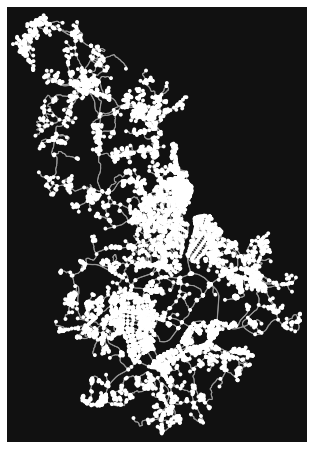

4286817794

In [69]:
import osmnx as ox
import numpy as np
np.array(a)
#print(c)
# np.argmin(a)
place = '세종시, 대한민국'
G = ox.graph_from_place(place, network_type='drive')  
fig, ax = ox.plot_graph(G)
G_utm = ox.project_graph(G, to_crs="epsg:5179")
start_node = ox.distance.nearest_nodes(G_utm, dfrg['Latitude'][0], dfrg['Longitude'][0])
start_node
#folium.Circle(start_node, radius=10, color='darkred', fill=True).add_to(m)
#m

In [ ]:
import osmnx as ox
start_latitude, start_longitude = 36.5001, 127.2682
arrival_latitude,arrival_longitude = 36.5003, 127.2595
place = '세종시, 대한민국'
G = ox.graph_from_place(place, network_type='drive')  
start_node = ox.distance.nearest_nodes(G, start_longitude, start_latitude)
arrival_node = ox.distance.nearest_nodes(G, arrival_longitude, arrival_latitude)
route = ox.shortest_path(G, start_node, arrival_node, weight='length')
route_points = [(G.nodes[route[i]]['y'], G.nodes[route[i]]['x']) for i in range(len(route))]  # G는 osmnx로 생성한 도로 드라이브 네트워크
folium.PolyLine(locations=route_points, color='blue', weight=5).add_to(m)                     # 경로 안에 있는 모든 i 노드(x,y)값을 반복해서 읽음
m
df2 = df[["Latitude", 'Longitude', '도로위험지수']]
df2.head()
# 사고지점의 위도, 경도와 가장 가까이에 있는 링크의 위도, 경도를 찾아서 색을 입힌다.
# 2. 노드, 링크에 색상으로 입혀야
# 범위 1) 위험도:0,보상:10, 녹색  2) 위험도 : 0<--<=10, 보상:5, 파란색  3) 위험도: 10< -- <= 20, 보상:4 , 노란색 
# 4) 20< -- <=30, 보상:3, 보라색   5) 30<--<=40, 보상:2, 주홍색   6) 40<--<=50, 보상 : 1, 빨간색      

In [70]:
import osmnx as ox
start_latitude, start_longitude = dfrg['Latitude'][0], dfrg['Longitude'][0]
arrival_latitude,arrival_longitude = 36.5003, 127.2595
place = '세종시, 대한민국'
G = ox.graph_from_place(place, network_type='drive')  
start_node = ox.distance.nearest_nodes(G, dfrg['Latitude'][0], dfrg['Longitude'][0])
arrival_node = ox.distance.nearest_nodes(G, arrival_longitude, arrival_latitude)
route = ox.shortest_path(G, start_node, arrival_node, weight='length')
route_points = [(G.nodes[route[i]]['y'], G.nodes[route[i]]['x']) for i in range(len(route))]  # G는 osmnx로 생성한 도로 드라이브 네트워크
folium.PolyLine(locations=route_points, color='blue', weight=5).add_to(m)                     # 경로 안에 있는 모든 i 노드(x,y)값을 반복해서 읽음
m